<a href="https://colab.research.google.com/github/AIceDog/Pyotrch-Notes/blob/master/Notes%20about%20Liangqu%20Long%20Courses%20of%20Pytorch%20Deep%20Learning/nn_Module.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms

nn.Module 是所有网络层次的父类, 当需要实现自己的层的时候, 必须继承 nn.Module 类. 现有的层也继承自 nn.Module. 

If we want to write our own neural network class, our class has to inherited from nn.Module. And we need to complete custom logic in funtion *__init__()*, complete the forward construction in function *forward()*.

In [ ]:
Example:
class MyLinear(nn.Module):

  def __init__(self, inp, outp):
    super(MyLinear, self).__init__()

    # requires_grad = True
    self.w = nn.Parameter(torch.randn(outp, inp))
    self.b = nn.Parameter(torch.randn(outp))

  def forward(self, x):
    x = x @ self.w.t() + self.b
    return x

nn.Module 是基本的父类, nn.Moudle 可以嵌套 nn.Module

# nn.Module 的功能

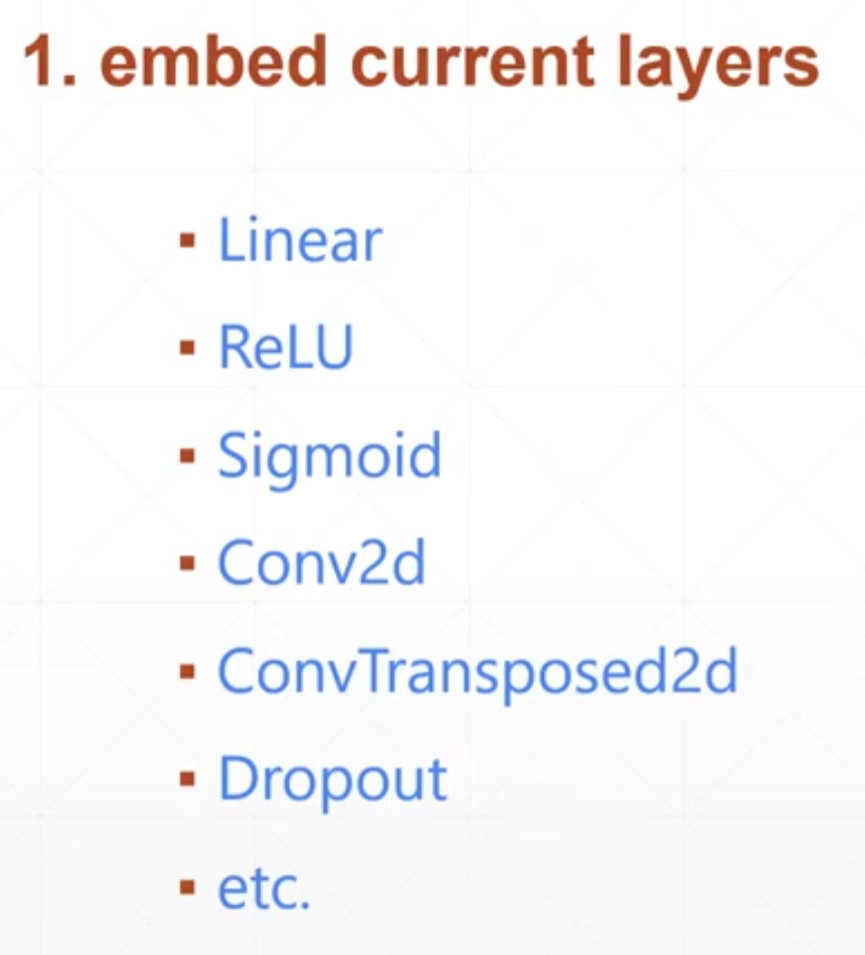

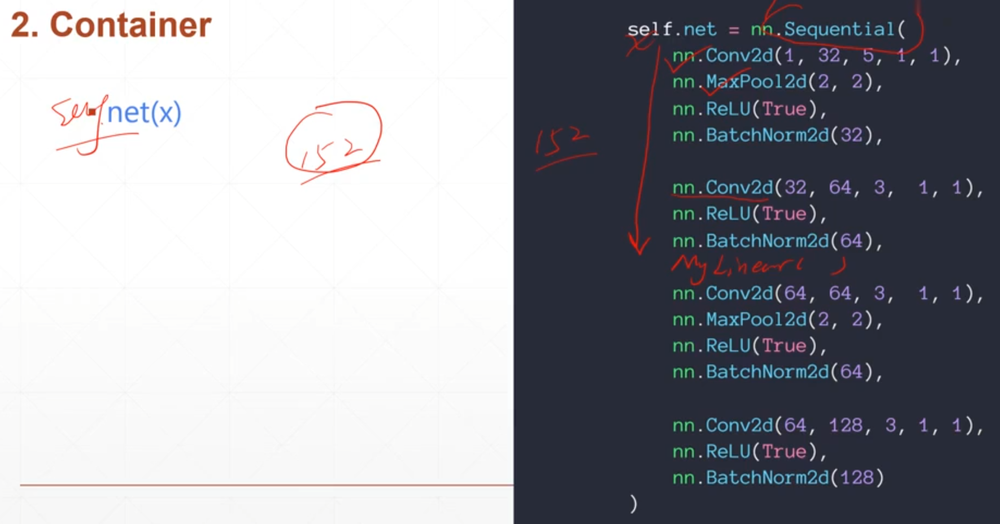

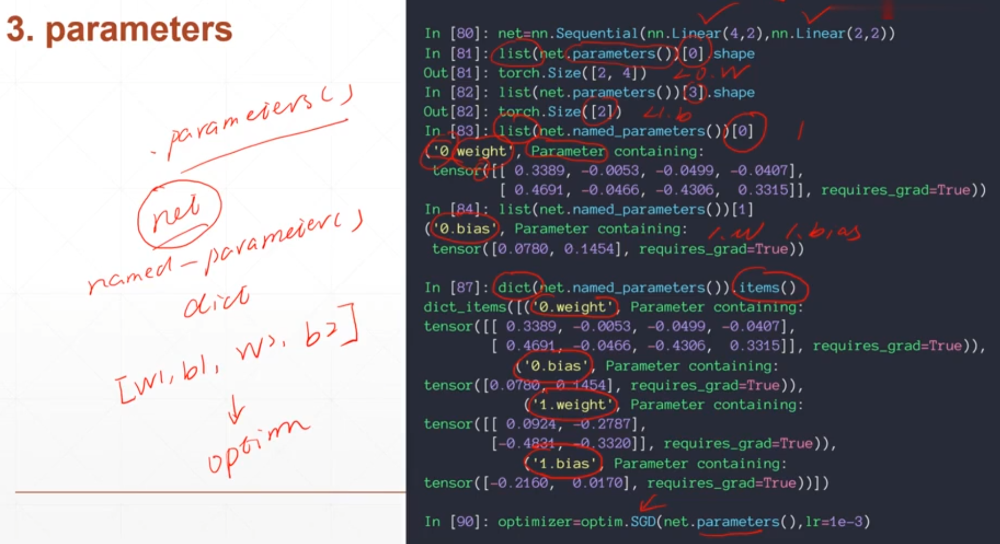

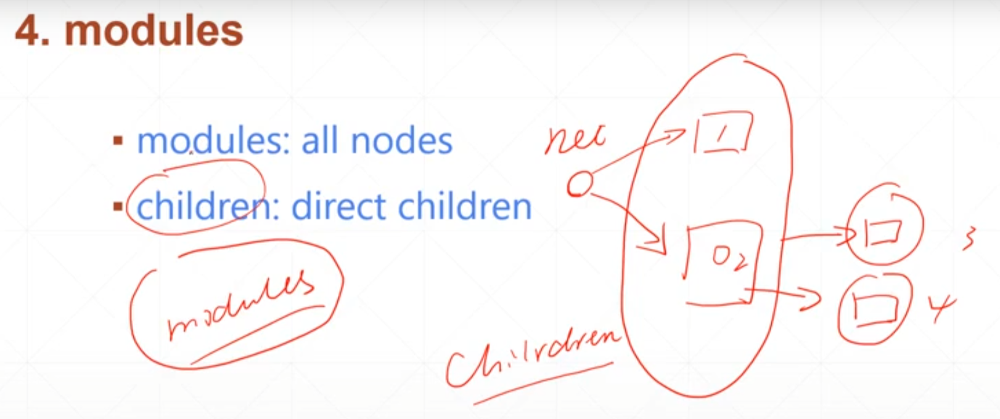

In [32]:
class BasicNet(nn.Module):
  def __init__(self):
    super(BasicNet, self).__init__()
    self.net = nn.Linear(4, 3)

  def forward(self, x):
    return self.net(x)


class Net(nn.Module):
  def __init__(self):
    super(Net, self).__init__()
    self.net = nn.Sequential(BasicNet(),   # nn.Sequential 本身也是 nn.Module 的类
                             nn.ReLU(),
                             nn.Linear(3, 2))

  def forward(self, x):
    return self.net(x)

In [36]:
basicNet = BasicNet()

In [37]:
basicNet

BasicNet(
  (net): Linear(in_features=4, out_features=3, bias=True)
)

In [39]:
list(basicNet.named_parameters())   # print named parameters of class BasicNet

[('net.weight', Parameter containing:
  tensor([[-0.0073, -0.4052,  0.3324, -0.3042],
          [ 0.4142,  0.4486,  0.1378, -0.4281],
          [-0.3496,  0.1455, -0.0916, -0.3702]], requires_grad=True)),
 ('net.bias', Parameter containing:
  tensor([0.1355, 0.0027, 0.0110], requires_grad=True))]

In [33]:
net = Net()

In [34]:
net

Net(
  (net): Sequential(
    (0): BasicNet(
      (net): Linear(in_features=4, out_features=3, bias=True)
    )
    (1): ReLU()
    (2): Linear(in_features=3, out_features=2, bias=True)
  )
)

In [41]:
list(net.named_parameters())   # print named parameters of class Net
# we can see that in class Net, nn.ReLU() doesn't include any parameters
# 'net.0' means 0th layer
# 'net.2' means 2nd layer

[('net.0.net.weight', Parameter containing:
  tensor([[-0.2373, -0.4738,  0.0047, -0.4097],
          [-0.1309,  0.0989,  0.1297,  0.2318],
          [ 0.2305, -0.3161,  0.1203, -0.4187]], requires_grad=True)),
 ('net.0.net.bias', Parameter containing:
  tensor([-0.3901,  0.3638,  0.3350], requires_grad=True)),
 ('net.2.weight', Parameter containing:
  tensor([[ 0.1482,  0.1075,  0.0344],
          [ 0.0794,  0.1337, -0.0175]], requires_grad=True)),
 ('net.2.bias', Parameter containing:
  tensor([-0.3851,  0.4004], requires_grad=True))]

In [42]:
net.children

<bound method Module.children of Net(
  (net): Sequential(
    (0): BasicNet(
      (net): Linear(in_features=4, out_features=3, bias=True)
    )
    (1): ReLU()
    (2): Linear(in_features=3, out_features=2, bias=True)
  )
)>

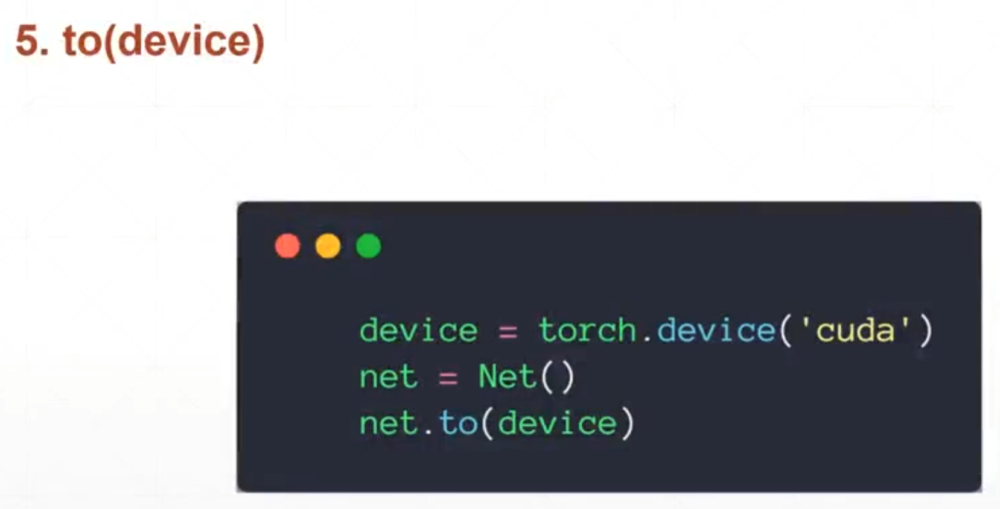

把对象 net 的所有的操作转移到 GPU 上

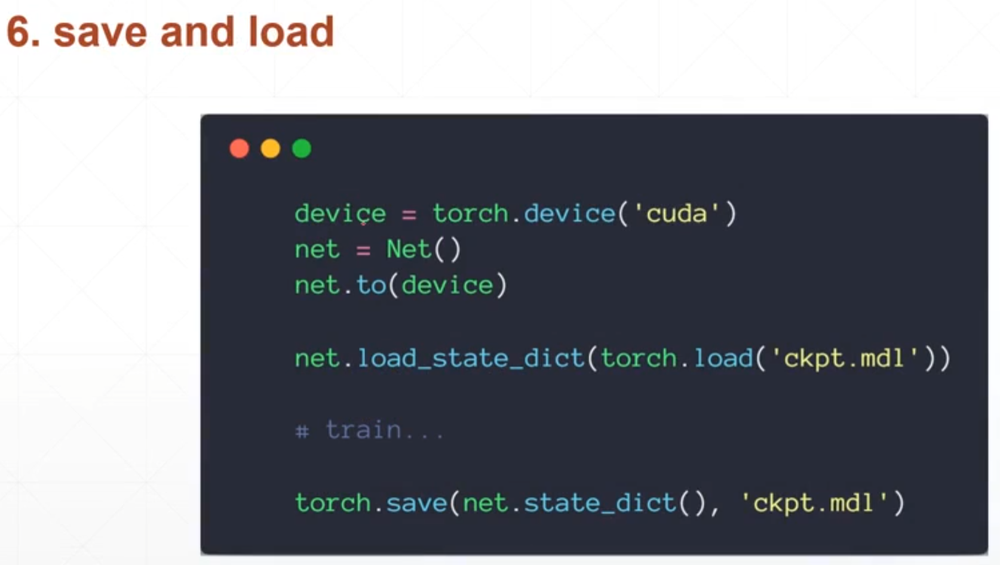

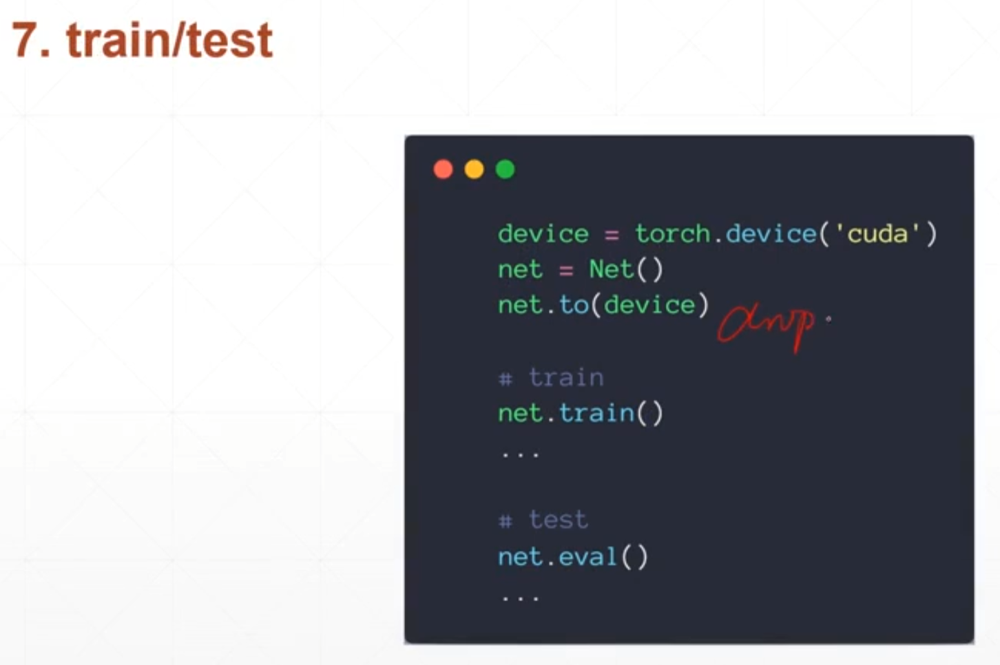

net.train() 将 net 切换为 train 状态, net.eval() 将 net 切换为 test 状态

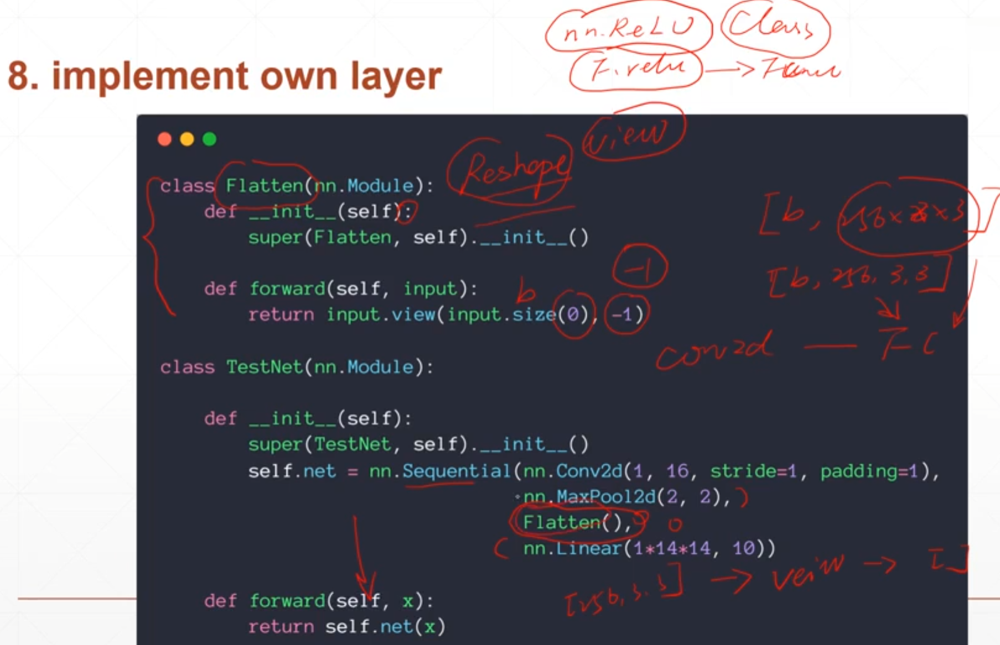

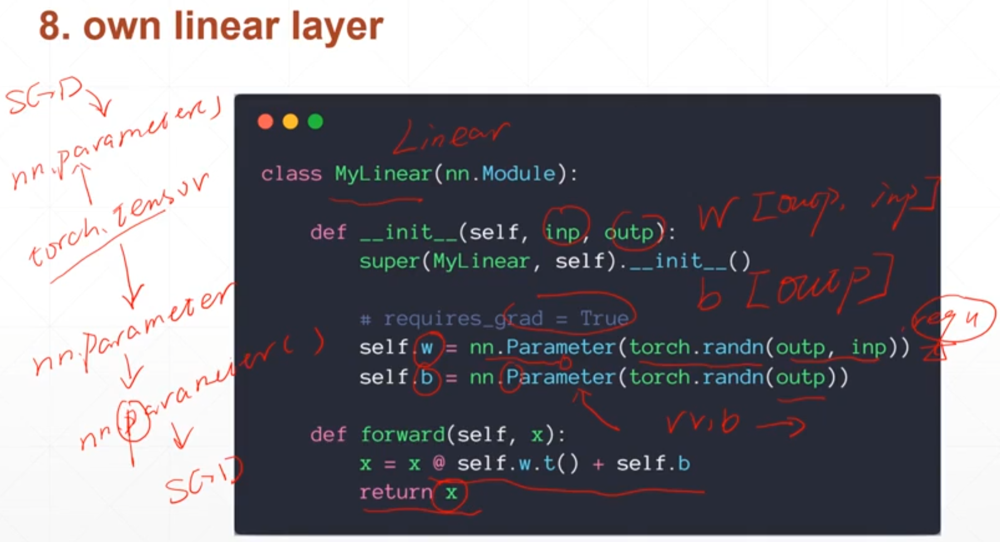